# locやbrightnessを変更させたnpyファイルを作成する

In [2]:
import numpy as np
import math
import scipy
import scipy.ndimage
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
from PIL import Image

import torch
from torch.nn import functional as F

import time
import pathlib
import copy
import tqdm

import astropy
import astroquery.vizier
import aplpy
# from regions import DS9Parser

In [3]:
from PIL import Image, ImageDraw, ImageFont

def data_view(col, imgs, infos=None, moji_size=100):
    '''
    col: number of columns
    imgs: tensor or nparray with a shape of (?, y, x, 1) or (?, y, x, 3)
    infos: dictonary from CutTable
    '''
    imgs = np.uint8(imgs[:, ::-1, :, 0]) if imgs.shape[3] == 1 else np.uint8(imgs[:,::-1])
    row = (lambda x, y: x//y if x/y-x//y==0.0 else x//y+1)(imgs.shape[0], col)
    dst = Image.new('RGB', (imgs.shape[1]*col, imgs.shape[2]*row))
    font = ImageFont.truetype('/usr/share/fonts/truetype/freefont/FreeMono.ttf', moji_size)
    for i, arr in enumerate(imgs):
        img = Image.fromarray(arr)
        img = img.point(lambda x: x * 1.5)
        if infos != None:
            draw = ImageDraw.Draw(img)
            draw.text((10, 10), '%s'%infos[i], font=font)
        quo, rem = i//col, i%col
        dst.paste(img, (arr.shape[0]*rem, arr.shape[1]*quo))

    return dst


In [4]:
def norm(data):
    min_ = np.min(data)
    b = np.std(data)
    mean = np.mean(data)
    data -= min_
    max_ = b*3 + mean
    data[data>max_] = max_

    data /= np.max(data)
    return data

def normalize(array):
    """
    入力：（y, x, 2 or 3）
    出力：（y ,x, 2 or 3）
    """
    gauss_list = []
    s = array.shape[2]
    for k in range(s):
        cut_data_k = array[:,:,k]
        cut_data_k = norm(cut_data_k)
        gauss_list.append(cut_data_k[:,:,None])                           

    cut_data = np.concatenate(gauss_list, axis=2)
    return cut_data

In [5]:
def resize(data, size):
    """
    sizeは、自由　　　　　　
    今はy ,xは同じサイズだが、違うサイズにしたければ、タプルでsizeを入力するとよい
    入力データ：（y, x, 2 or 3）
    出力：（size ,size, 2 or 3）
    """
    cut_data = np.swapaxes(data, 1, 2)
    cut_data = np.swapaxes(cut_data, 0, 1)
    cut_data = torch.from_numpy(cut_data)
    cut_data = cut_data.unsqueeze(0)
    resize_data = F.interpolate(cut_data, (size, size), mode='bilinear', align_corners=False)
    resize_data = np.squeeze(resize_data.detach().numpy())
    
    resize_data_ = np.swapaxes(resize_data, 0, 1)
    resize_data_ = np.swapaxes(resize_data_, 1, 2)
    return resize_data_

In [6]:
from scipy import signal
def conv(obj_size, obj_sig, data):
    """
    dataの入力サイズ↓
    入力：（y ,x, 2 or 3）
    出力：（size ,size, 2 or 3）
    -------------------------------
    切り出したデータがobj_sizeより大きければ、smoothingをする
    小さければ、そのまま返す。
    """
    if data.shape[0]>obj_size:
        fwhm = (data.shape[0]/obj_size)*2
        sig3 = fwhm/(2*(2*np.log(2))**(1/2))
        sig2 = (sig3**2-obj_sig**2)**(1/2)

        kernel = np.outer(signal.gaussian(8*round(sig2)+1, sig2), signal.gaussian(8*round(sig2)+1, sig2))
        kernel1= kernel/np.sum(kernel)

        conv_list = []
        for k in range(data.shape[2]):
            cut_data_k = data[:,:,k]
            lurred_k = signal.fftconvolve(cut_data_k, kernel1, mode='same')
            conv_list.append(lurred_k[:,:,None])

        pi = np.concatenate(conv_list, axis=2)
    else:
        pi = data
    return pi

In [7]:
viz = astroquery.vizier.Vizier(columns=['*'])
viz.ROW_LIMIT = -1
MWP = viz.query_constraints(catalog='2019yCat..74881141J ')[0].to_pandas()
MWP.loc[MWP['GLON']>=358.446500015535, 'GLON'] -=360 
MWP

,MWP,GLON,GLAT,Disp,MajAxis,MinAxis,Reff,e_Reff,theta,e_theta,...,HR3,RelFlag,HierFlag,IDDR1,IDA14,Dist,IDCW,Simbad,_RA.icrs,_DE.icrs
0,b'2G0000794-0020817',0.0794,-0.2082,0.22,0.58,0.49,0.53,0.13,161,133,...,0.18,b'R',b'',b'1G000080-002075',b'G000.079-00.211',NaN,b'CN2',b'Simbad',266.6554,-28.9766
1,b'2G0001255+0003035',0.1255,0.0303,1.01,5.05,4.26,4.67,0.59,87,62,...,0.20,b'C',b'',b'1G000127+000485',b'G000.132+00.039',NaN,b'',b'Simbad',266.4501,-28.8133
2,b'2G0001301-0067518',0.1301,-0.6752,0.20,0.45,0.37,0.41,0.12,24,122,...,0.42,b'R',b'',b'',b'G000.129-00.674',NaN,b'CN4',b'Simbad',267.1427,-29.1749
3,b'2G0001400-0011719',0.1400,-0.1172,0.29,3.14,2.98,3.06,0.37,11,86,...,0.46,b'C',b'',b'1G000140-001173',b'G000.138-00.115',NaN,b'',b'Simbad',266.6025,-28.8776
4,b'2G0002791-0048490',0.2791,-0.4849,0.12,0.42,0.38,0.40,0.23,34,94,...,0.08,b'R',b'',b'',b'G000.279-00.482',NaN,b'CN7',b'Simbad',267.0442,-28.9491
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2595,b'2G3593514-0041492',-0.6486,-0.4149,0.34,0.44,0.35,0.40,0.24,52,83,...,0.08,b'C',b'',b'1G359350-004141',b'G359.349-00.417',NaN,b'',b'Simbad',266.4237,-29.7059
2596,b'2G3596901+0006590',-0.3099,0.0659,0.10,0.59,0.51,0.55,0.06,77,79,...,0.13,b'C',b'',b'',b'G359.690+00.065',NaN,b'',b'Simbad',266.1557,-29.1661
2597,b'2G3597425-0041121',-0.2575,-0.4112,0.94,1.97,1.82,1.90,0.68,27,106,...,0.44,b'R',b'',b'1G359737-004097',b'G359.740-00.412',NaN,b'CS2',b'Simbad',266.6538,-29.3700
2598,b'2G3599224+0011336',-0.0776,0.1134,0.28,1.08,0.93,1.00,0.31,103,64,...,0.24,b'C',b'',b'',b'G359.930+00.108',NaN,b'',b'Simbad',266.2482,-28.9432


In [8]:
cygnus_ring = []
start = time.time()
# fits_path = pathlib.Path('../cygnus_fits/')
sig1 = 1/(2*(np.log(2))**(1/2))
count = 0

ring_pd_mwp = pd.DataFrame(index=[], columns=['GLON', 'GLAT', 'Disp', 'MajAxis', 'MinAxis', 'Reff', 'e_Reff',
                                              'theta', 'e_theta', 'Ecc', 'HR2', 'HR3', 'RelFlag', 'HierFlag', 'IDDR1',
                                              'IDA14', 'Dist', 'IDCW', '_RA.icrs', '_DE.icrs'])


In [9]:
rfits_path = '../cygnus_fits/M1_fits_file/M1_cygnus_2.4.fits'
gfits_path = '../cygnus_fits/I4_fits_file/I4_2.4_reg.fits'
bfits_path = '../cygnus_fits/I1_fits_file/I1_reg_2.4.fits'
spitzer_rfits = astropy.io.fits.open(rfits_path)[0]
spitzer_gfits = astropy.io.fits.open(gfits_path)[0]
spitzer_bfits = astropy.io.fits.open(bfits_path)[0]
w = astropy.wcs.WCS(spitzer_rfits.header)

In [10]:
min(MWP['Reff']/60)/spitzer_rfits.header['CDELT2']

2.7500026768938546

In [11]:
data_ = np.concatenate([spitzer_rfits.data[:,:,None], 
                           spitzer_gfits.data[:,:,None], 
                           spitzer_bfits.data[:,:,None]], axis=2)
data_[data_ != data_] = 0
data = copy.deepcopy(data_)

In [12]:
mwp = pd.read_csv('../MWP_Cygnus_catalogue.csv')
mwp = mwp.drop('Unnamed: 0', axis=1)
mwp['id'] = [i for i in range(len(mwp))]
mwp.head()

,MWP,GLON,GLAT,Disp,MajAxis,MinAxis,Reff,e_Reff,theta,e_theta,...,HR3,RelFlag,HierFlag,IDDR1,IDA14,Dist,IDCW,_RA.icrs,_DE.icrs,id
0,2G0757649+0035573,75.7650,0.3557,0.94,1.08,0.79,0.95,0.40,68,99,...,0.09,C,NaN,NaN,G075.768+00.344,3.8,NaN,305.4077,37.4371,0
1,2G0758429+0036690,75.8429,0.3669,0.28,0.60,0.49,0.55,0.19,48,81,...,0.18,R,NaN,NaN,G075.844+00.359,1.5,NaN,305.4521,37.5075,1
2,2G0758992+0035684,75.8992,0.3569,0.34,1.20,0.67,0.97,0.11,168,64,...,0.21,C,NaN,NaN,G075.890+00.358,NaN,NaN,305.5029,37.5481,2
3,2G0761384-0030183,76.1384,-0.3018,0.86,1.79,1.38,1.60,0.55,30,101,...,0.38,R,NaN,NaN,G076.139-00.303,NaN,NaN,306.3553,37.3658,3
4,2G0761874+0054827,76.1875,0.5483,1.09,2.10,1.57,1.85,0.70,40,91,...,0.25,R,NaN,NaN,G076.199+00.548,1.5,NaN,305.5120,37.8941,4


### 位置をずらしたバブルデータを作成
### 2G0780301+0061158の位置をずらしていって、confがどのように変わるのかを確認する

In [35]:
cygnus_ring = []
row = mwp.iloc[19]
slide_num = 10
for kk in tqdm.tqdm(range(slide_num)):
#     print(row)
    import random
    # サイズをバラバラにする。
#     random_num = 1/np.random.uniform(0.125, 0.9) 
    random_num = 3
    
    lmax = row['_RA.icrs'] + random_num*1.5*row['Reff']/60
    bmin = row['_DE.icrs'] - random_num*1.5*row['Reff']/60
    #右端
    lmin = row['_RA.icrs'] - random_num*1.5*row['Reff']/60
    bmax = row['_DE.icrs'] + random_num*1.5*row['Reff']/60
#     print(lmin, lmax, bmin, bmax)
    x_min, y_min = w.all_world2pix(lmax, bmin, 0)
    x_max, y_max = w.all_world2pix(lmin, bmax, 0)
#     print(x_max, x_min)
    r = int((x_max - x_min)/(2*random_num))#ringの半径pixel
    
    width = x_max - x_min
    height = y_max - y_min
    
    x_pix_min = x_min - width/2
    y_pix_min = y_min - height/2
    x_pix_max = x_max + width/2
    y_pix_max = y_max + height/2
    
    #random_num - ２とは、切り出した画像が一辺random_num*rに対し、bboxが2*rだから、画像からリングがはみ出さないように
#     x_offset = random.uniform(-(random_num-1.5)*r, (random_num-1.5)*r)
#     y_offset = random.uniform(-(random_num-1.5)*r, (random_num-1.5)*r)
    x_offset = np.linspace(-(random_num-1.5)*r, (random_num-1.5)*r, slide_num)[kk]
    y_offset = np.linspace(-(random_num-1.5)*r, (random_num-1.5)*r, slide_num)[kk]
#     if (kk+1)%5 == 0:
#         y_offset = (x_offset[1] - x_offset[0])*(kk+1)//5
#     x_offset = x_offset[kk]
    x_pix_min = x_pix_min + int(x_offset)
    x_pix_max = x_pix_max + int(x_offset)
    y_pix_min = y_pix_min + int(y_offset)
    y_pix_max = y_pix_max + int(y_offset)
#     print(x_pix_min, x_pix_max, y_pix_min, y_pix_max)
    width = x_pix_max - x_pix_min
    height = y_pix_max - y_pix_min
    
    
# このif文の意味
# pandasにあるbubbleの情報は、bubbleの中心座標で、その中心座標を元にリングを切り出すわけだが、リングがfitsの端の方にあると、3倍の大きさで切り出す時に
# fitsからはみ出して、切り出そうとする。　そうなると、おかしなことになる為（resizeできないdataとなる）、　条件分岐をした

    if x_pix_min<=0 or y_pix_min<=0:
        pass

    else:
        c_data = data[int(y_pix_min):int(y_pix_max), int(x_pix_min):int(x_pix_max)].view()
        cut_data = copy.deepcopy(c_data)
        pi = conv(300, sig1, cut_data)
        r_shape_y = pi.shape[0]
        r_shape_x = pi.shape[1]
        res_data = pi[int(r_shape_y/4):int(r_shape_y*3/4), int(r_shape_x/4):int(r_shape_x*3/4)]
        res_data = normalize(res_data)
        res_data = resize(res_data, 300)
        cygnus_ring.append(res_data)
        
#         ring_pd1 = pd.DataFrame([row])
#         ring_pd_mwp = pd.concat([ring_pd_mwp, ring_pd1])

100%|██████████| 10/10 [00:00<00:00, 10.98it/s]


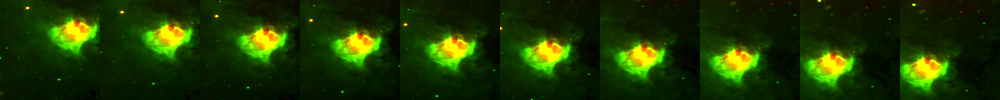

In [37]:
mwp_ring_list_ = np.array(cygnus_ring)
np.save('cygnus_slide_loc_2G0780301+0061158.npy', mwp_ring_list_)
# mwp_ring_list_ = mwp_ring_list_
mwp_ring_list_ = mwp_ring_list_*255
mwp_ring_list_ = np.uint8(mwp_ring_list_)
mwp_ring_list_[:,:,:,2] = 0
data_view(10, mwp_ring_list_)

In [33]:
silde_pix = 5
cygnus_ring = []
x_offset_list = []
y_offset_list = []

row = mwp.iloc[19]
import random
random_num = 3
    
lmax = row['_RA.icrs'] + random_num*1.5*row['Reff']/60
bmin = row['_DE.icrs'] - random_num*1.5*row['Reff']/60
#右端
lmin = row['_RA.icrs'] - random_num*1.5*row['Reff']/60
bmax = row['_DE.icrs'] + random_num*1.5*row['Reff']/60

x_min, y_min = w.all_world2pix(lmax, bmin, 0)
x_max, y_max = w.all_world2pix(lmin, bmax, 0)

r = int((x_max - x_min)/(2*random_num))

width = x_max - x_min
height = y_max - y_min

x_pix_min_ = x_min - width/2
y_pix_min_ = y_min - height/2
x_pix_max_ = x_max + width/2
y_pix_max_ = y_max + height/2

x_offset = -1.5*r
y_offset = -1.5*r

slide_num = int(((2*(random_num-1.5)*r-2*r)/silde_pix)**2)

for kk in tqdm.tqdm(range(slide_num)):
    
    if x_offset+2*r > 2*(random_num-1.5)*r:
        x_offset = -1.5*r
        y_offset += silde_pix

    else:
        x_offset += silde_pix
    
    x_offset_list.append(x_offset)
    y_offset_list.append(y_offset)
    
    x_pix_min = x_pix_min_ + int(x_offset)
    x_pix_max = x_pix_max_ + int(x_offset)
    y_pix_min = y_pix_min_ + int(y_offset)
    y_pix_max = y_pix_max_ + int(y_offset)
#     print(x_pix_min, x_pix_max, y_pix_min, y_pix_max)
    width = x_pix_max - x_pix_min
    height = y_pix_max - y_pix_min
    
    
# このif文の意味
# pandasにあるbubbleの情報は、bubbleの中心座標で、その中心座標を元にリングを切り出すわけだが、リングがfitsの端の方にあると、3倍の大きさで切り出す時に
# fitsからはみ出して、切り出そうとする。　そうなると、おかしなことになる為（resizeできないdataとなる）、　条件分岐をした

    if x_pix_min<=0 or y_pix_min<=0:
        pass

    else:
        c_data = data[int(y_pix_min):int(y_pix_max), int(x_pix_min):int(x_pix_max)].view()
        cut_data = copy.deepcopy(c_data)
        pi = conv(300, sig1, cut_data)
        r_shape_y = pi.shape[0]
        r_shape_x = pi.shape[1]
        res_data = pi[int(r_shape_y/4):int(r_shape_y*3/4), int(r_shape_x/4):int(r_shape_x*3/4)]
        res_data = normalize(res_data)
        res_data = resize(res_data, 300)
        cygnus_ring.append(res_data)
        


100%|██████████| 237/237 [00:21<00:00, 11.04it/s]


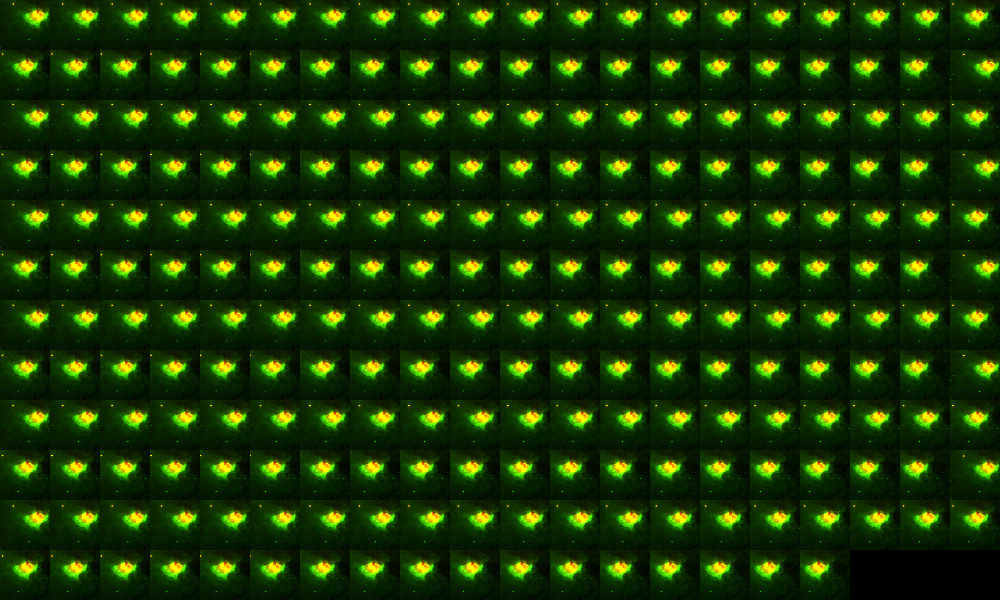

In [34]:
mwp_ring_list_ = np.array(cygnus_ring)
np.save('cygnus_slidepix_5_2G0780301+0061158.npy', mwp_ring_list_)
# mwp_ring_list_ = mwp_ring_list_
mwp_ring_list_ = mwp_ring_list_*255
mwp_ring_list_ = np.uint8(mwp_ring_list_)
mwp_ring_list_[:,:,:,2] = 0
data_view(20, mwp_ring_list_)

In [35]:
y_offset_list

[-115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -115.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -110.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 -105.5,
 

In [36]:
np.save('y_offset_list.npy',y_offset_list)
np.save('x_offset_list.npy',x_offset_list)

In [37]:
mwp_ring_list_.shape

(237, 300, 300, 3)

In [38]:
mwp_ring_list_.max()

255

### 明るさを0.1～2.0まで0.1刻みで変更
### SSDがどこまでの明るさに対応できるかを調べる

In [39]:
np.arange(0.1, 2.1, 0.1)

array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
       1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. ])

In [42]:
cygnus_ring = []
row = mwp.iloc[19]
# slide_num = 10
for kk in tqdm.tqdm(np.arange(0.1, 2.1, 0.1)):
#     print(row)
    import random
    # サイズをバラバラにする。
#     random_num = 1/np.random.uniform(0.125, 0.9) 
    random_num = 3
    
    lmax = row['_RA.icrs'] + random_num*1.5*row['Reff']/60
    bmin = row['_DE.icrs'] - random_num*1.5*row['Reff']/60
    #右端
    lmin = row['_RA.icrs'] - random_num*1.5*row['Reff']/60
    bmax = row['_DE.icrs'] + random_num*1.5*row['Reff']/60
#     print(lmin, lmax, bmin, bmax)
    x_min, y_min = w.all_world2pix(lmax, bmin, 0)
    x_max, y_max = w.all_world2pix(lmin, bmax, 0)
#     print(x_max, x_min)
    r = int((x_max - x_min)/(2*random_num))#ringの半径pixel
    
    width = x_max - x_min
    height = y_max - y_min
    
    x_pix_min = x_min - width/2
    y_pix_min = y_min - height/2
    x_pix_max = x_max + width/2
    y_pix_max = y_max + height/2

    width = x_pix_max - x_pix_min
    height = y_pix_max - y_pix_min
    
    
# このif文の意味
# pandasにあるbubbleの情報は、bubbleの中心座標で、その中心座標を元にリングを切り出すわけだが、リングがfitsの端の方にあると、3倍の大きさで切り出す時に
# fitsからはみ出して、切り出そうとする。　そうなると、おかしなことになる為（resizeできないdataとなる）、　条件分岐をした

    if x_pix_min<=0 or y_pix_min<=0:
        pass

    else:
        c_data = data[int(y_pix_min):int(y_pix_max), int(x_pix_min):int(x_pix_max)].view()
        cut_data = copy.deepcopy(c_data)
        pi = conv(300, sig1, cut_data)
        r_shape_y = pi.shape[0]
        r_shape_x = pi.shape[1]
        res_data = pi[int(r_shape_y/4):int(r_shape_y*3/4), int(r_shape_x/4):int(r_shape_x*3/4)]
        res_data = normalize(res_data)
        res_data = resize(res_data, 300)
        cygnus_ring.append(res_data*kk)
        
#         ring_pd1 = pd.DataFrame([row])
#         ring_pd_mwp = pd.concat([ring_pd_mwp, ring_pd1])

100%|██████████| 20/20 [00:01<00:00, 11.34it/s]


In [ ]:
mwp_ring_list_ = np.array(cygnus_ring)
np.save('cygnus_change_bright_2G0780301+0061158.npy', mwp_ring_list_)
# mwp_ring_list_ = mwp_ring_list_
mwp_ring_list_ = mwp_ring_list_*255
mwp_ring_list_ = np.uint8(mwp_ring_list_)
mwp_ring_list_[:,:,:,2] = 0
data_view(10, mwp_ring_list_)

In [12]:
cygnus_ring = []
for index,row in tqdm.tqdm(mwp.iterrows()):
#     print(row)
    import random
    # サイズをバラバラにする。
    random_num = 1/np.random.uniform(0.125, 0.9) 
    
    lmax = row['_RA.icrs'] + random_num*1.5*row['Reff']/60
    bmin = row['_DE.icrs'] - random_num*1.5*row['Reff']/60
    #右端
    lmin = row['_RA.icrs'] - random_num*1.5*row['Reff']/60
    bmax = row['_DE.icrs'] + random_num*1.5*row['Reff']/60
#     print(lmin, lmax, bmin, bmax)
    x_min, y_min = w.all_world2pix(lmax, bmin, 0)
    x_max, y_max = w.all_world2pix(lmin, bmax, 0)
#     print(x_max, x_min)
    r = int((x_max - x_min)/(2*random_num))#ringの半径pixel
    
    width = x_max - x_min
    height = y_max - y_min
    
    x_pix_min = x_min - width/2
    y_pix_min = y_min - height/2
    x_pix_max = x_max + width/2
    y_pix_max = y_max + height/2
    
    #random_num - ２とは、切り出した画像が一辺random_num*rに対し、bboxが2*rだから、画像からリングがはみ出さないように
    x_offset = random.uniform(-(random_num-1.5)*r, (random_num-1.5)*r)
    y_offset = random.uniform(-(random_num-1.5)*r, (random_num-1.5)*r)
    x_pix_min = x_pix_min + int(x_offset)
    x_pix_max = x_pix_max + int(x_offset)
    y_pix_min = y_pix_min + int(y_offset)
    y_pix_max = y_pix_max + int(y_offset)
#     print(x_pix_min, x_pix_max, y_pix_min, y_pix_max)
    width = x_pix_max - x_pix_min
    height = y_pix_max - y_pix_min
    
    
# このif文の意味
# pandasにあるbubbleの情報は、bubbleの中心座標で、その中心座標を元にリングを切り出すわけだが、リングがfitsの端の方にあると、3倍の大きさで切り出す時に
# fitsからはみ出して、切り出そうとする。　そうなると、おかしなことになる為（resizeできないdataとなる）、　条件分岐をした

    if x_pix_min<=0 or y_pix_min<=0:
        pass

    else:
        c_data = data[int(y_pix_min):int(y_pix_max), int(x_pix_min):int(x_pix_max)].view()
        cut_data = copy.deepcopy(c_data)
        pi = conv(300, sig1, cut_data)
        r_shape_y = pi.shape[0]
        r_shape_x = pi.shape[1]
        res_data = pi[int(r_shape_y/4):int(r_shape_y*3/4), int(r_shape_x/4):int(r_shape_x*3/4)]
        res_data = normalize(res_data)
        res_data = resize(res_data, 300)
        cygnus_ring.append(res_data)
        
        ring_pd1 = pd.DataFrame([row])
        ring_pd_mwp = pd.concat([ring_pd_mwp, ring_pd1])

47it [00:05,  9.32it/s]


In [ ]:
mwp_ring_list_ = np.array(cygnus_ring)
# np.save('cygnus_ring_random_loc.npy', mwp_ring_list_)
# mwp_ring_list_ = mwp_ring_list_
mwp_ring_list_ = mwp_ring_list_*255
mwp_ring_list_ = np.uint8(mwp_ring_list_)
mwp_ring_list_[:,:,:,2] = 0
data_view(8, mwp_ring_list_, mwp['id'].tolist())#.save('MWP_cygnus_ring_random_loc.png')#, mwp['id'].tolist())#.save('MWP_cygnus_ring.pdf')

In [25]:
color_min_R = 30
color_max_R = 100.0
color_min_G = 10
color_max_G = 150
color_min_B = 30
color_max_B = 100

In [26]:
colorval = "%.1f_%.1f_%.1f_%.1f_%.1f_%.1f"%(color_min_R, color_max_R, color_min_G, color_max_G, color_min_B, color_max_B)
save_png_name = '../cygnus_fits/RG_%s'%colorval + '_2.4.png'
fitss = [rfits_path, gfits_path, bfits_path]

In [14]:
Image.MAX_IMAGE_PIXELS = 1000000000

In [15]:
mwp.head()

,MWP,GLON,GLAT,Disp,MajAxis,MinAxis,Reff,e_Reff,theta,e_theta,...,HR2,HR3,RelFlag,HierFlag,IDDR1,IDA14,Dist,IDCW,_RA.icrs,_DE.icrs
0,2G0757649+0035573,75.7650,0.3557,0.94,1.08,0.79,0.95,0.40,68,99,...,0.01,0.09,C,NaN,NaN,G075.768+00.344,3.8,NaN,305.4077,37.4371
1,2G0758429+0036690,75.8429,0.3669,0.28,0.60,0.49,0.55,0.19,48,81,...,0.09,0.18,R,NaN,NaN,G075.844+00.359,1.5,NaN,305.4521,37.5075
2,2G0758992+0035684,75.8992,0.3569,0.34,1.20,0.67,0.97,0.11,168,64,...,NaN,0.21,C,NaN,NaN,G075.890+00.358,NaN,NaN,305.5029,37.5481
3,2G0761384-0030183,76.1384,-0.3018,0.86,1.79,1.38,1.60,0.55,30,101,...,0.16,0.38,R,NaN,NaN,G076.139-00.303,NaN,NaN,306.3553,37.3658
4,2G0761874+0054827,76.1875,0.5483,1.09,2.10,1.57,1.85,0.70,40,91,...,0.12,0.25,R,NaN,NaN,G076.199+00.548,1.5,NaN,305.5120,37.8941


In [ ]:
#MWP_in_cygnus

fig = plt.figure(figsize=(16, 16))
f = aplpy.FITSFigure(gfits_path, slices=[0], figure=fig, convention='wells', north=True)
f.show_rgb(save_png_name)
f.ticks.set_color('w')
f.ticks.set_linewidth(1.5)  # points
f.ticks.set_minor_frequency(2)
f.tick_labels.set_font(size=40, family='serif')
f.axis_labels.set_font(size=40, family='serif')

f.show_circles(xw=mwp['_RA.icrs'], yw=mwp['_DE.icrs'], 
                  radius=mwp['Reff']/60, edgecolor=None, color='#F5F5F5', linewidth=1)

for i in range(len(mwp)):
    f.add_label(x=mwp['_RA.icrs'].values[i]-mwp['Reff'].values[i]/60, y=mwp['_DE.icrs'].values[i]+mwp['Reff'].values[i]/60, 
                text=str(mwp['id'].values[i]), color='#F5F5F5', size=15)
    
f.recenter(307.7, 40.23, width=6.5, height=6.3)
plt.title('Cygnus X ', fontsize=60)
plt.tight_layout()
f.save('MWP_ring_in_Cygnus.pdf')